<a href="https://colab.research.google.com/github/Kousuke-N/digital_image_processing/blob/main/weed_detection_system.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 事前準備

・Googleドライブの以下の場所にサンプル画像を"field.jpg"と言う名前で保存する。→`/content/drive/My Drive/dip`

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

#Googleドライブへのマウント
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/My Drive/dip"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/dip


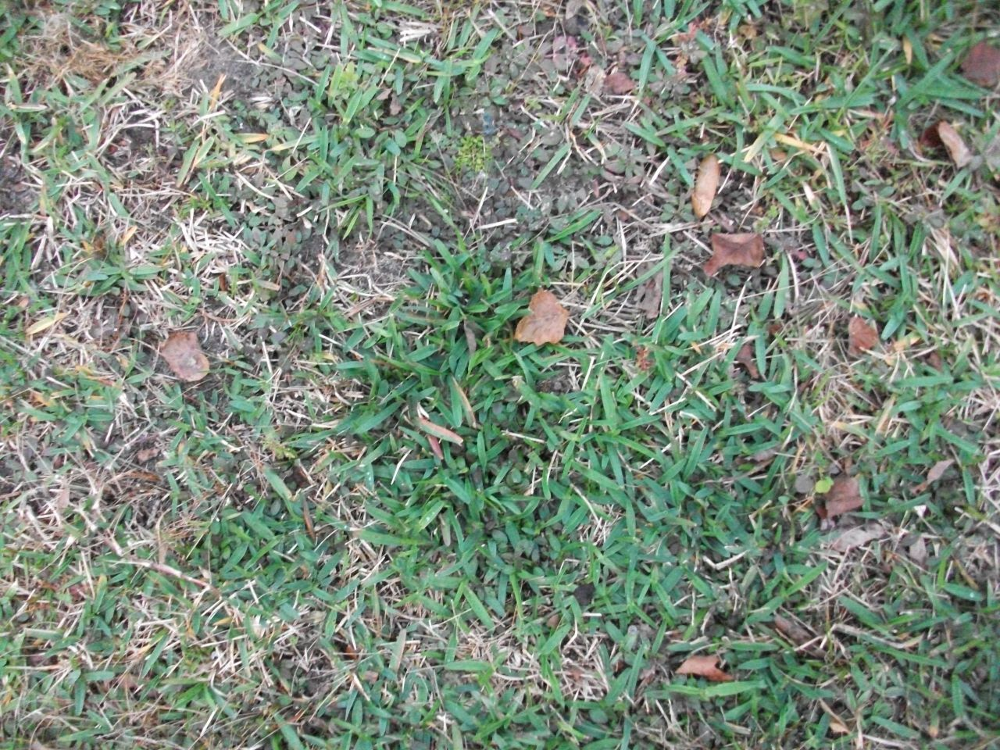

In [ ]:
# 画像の読み込み
img = cv2.imread("field.jpg")
cv2_imshow(img)

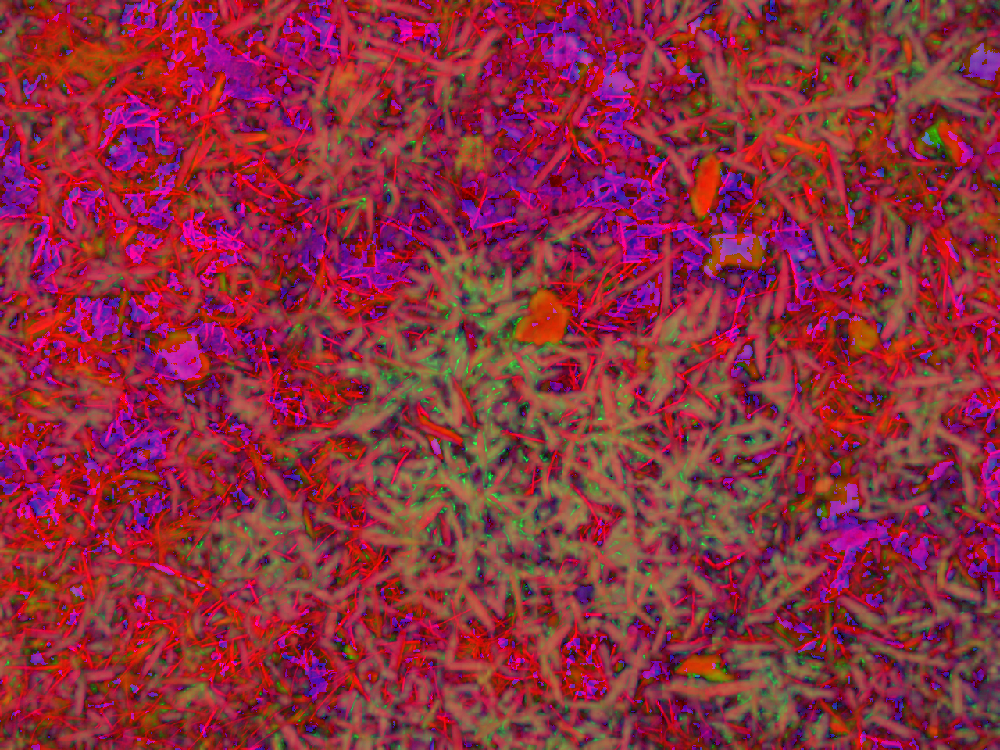

[[[ 50  48 121]
  [ 50  46 127]
  [ 46  43 129]
  ...
  [ 46  59  73]
  [ 38  57  67]
  [ 37  68  64]]

 [[ 50  47 125]
  [ 48  50 133]
  [ 48  43 138]
  ...
  [ 46  65  59]
  [ 43  72  57]
  [ 42  85  54]]

 [[ 51  55 120]
  [ 48  53 129]
  [ 47  46 138]
  ...
  [ 46  70  55]
  [ 46  75  58]
  [ 46  75  58]]

 ...

 [[ 48  66 105]
  [ 47  74 100]
  [ 48  68 101]
  ...
  [ 84  44 109]
  [ 80  38 100]
  [ 80  42  92]]

 [[ 44  69 122]
  [ 43  78 117]
  [ 44  73 116]
  ...
  [ 84  42 115]
  [ 84  38 107]
  [ 84  40 101]]

 [[ 43  63 149]
  [ 43  66 143]
  [ 43  67 141]
  ...
  [ 83  47 114]
  [ 84  38 108]
  [ 84  39 104]]]


In [72]:
# HSV色空間へ変換
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
print(img_hsv)

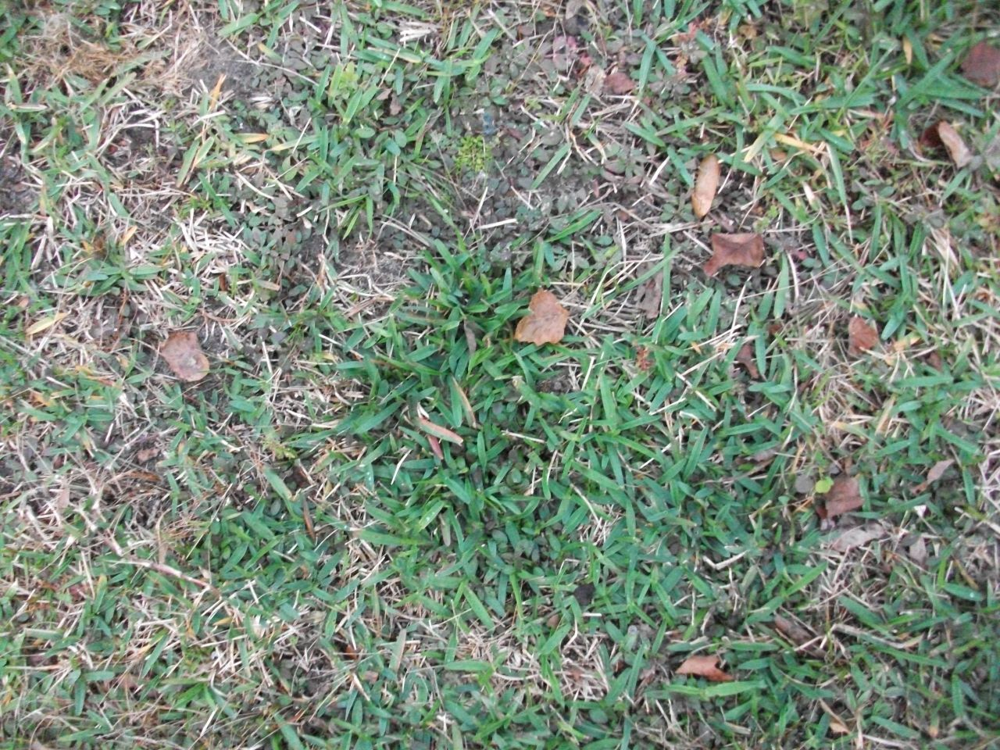

In [76]:
img_hoge = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2BGR)
cv2_imshow(img_hoge)

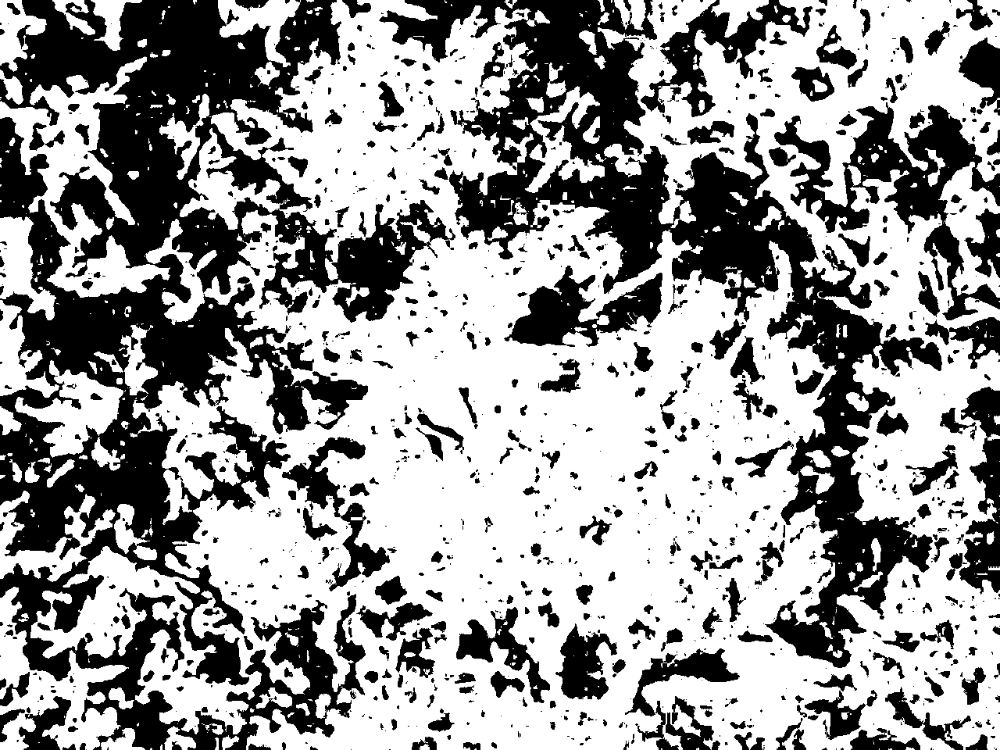

In [102]:
# 検出部
# 緑色はHが80〜150程度の部分を占めるので、該当するセルは255に変換し、それ以外は0にする
output_img = np.array([[255 if cell[0] > 35 and cell[0] < 85 else 0 for cell in line] for line in img_hsv])
cv2_imshow(output_img)

In [ ]:
# ファイルへの書き込み
cv2.imwrite('output.jpeg', output_img)

True

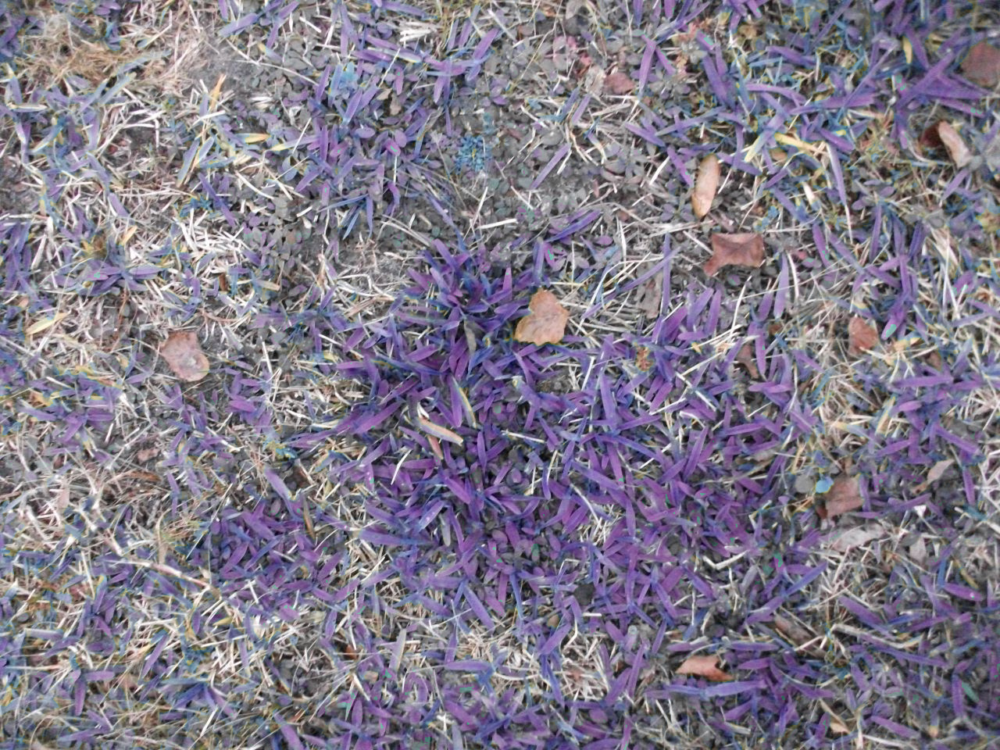

In [101]:
# 緑色の部分を青色にする
output_img2 = np.array([[np.array([cell[0] + 60, cell[1], cell[2]]) if cell[0] > 35 and cell[0] < 85 else list(cell) for cell in line] for line in img_hsv])
cv2_imshow(cv2.cvtColor(output_img2.astype(np.uint8), cv2.COLOR_HSV2BGR))